# Syntactic Graph Analysis



Syntactic speech graphs are constructed in line with
1) Mota, N.B., Furtado, R., Maia, P.P.C., Copelli, M. & Ribeiro, S.
    Graph analysis of dream reports is especially informative about
    psychosis. Sci. Rep. 4, 3691; DOI:10.1038/srep03691 (2014)
2) Mota NB, et al. (2012) Speech Graphs Provide a Quantitative
    Measure of Thought Disorder in Psychosis. PLoS ONE 7(4): e34928.
    doi: 10.1371 / journal.pone.0034928

Syntactic graph measures were calculated using the SpeechGraphs program
to create and describe syntactic graphs from the transcript data (saved
as params_table.txt)
- Tool is available [here](https://neuro.ufrn.br/_tools/speechgraph/)
- Tool [documentation](http://www.neuro.ufrn.br/softwares/speechgraphs)
- PDF of tool [documentation](https://neuro.ufrn.br/_pdf/SpeechGraphs_UserGuide.pdf)



Variables:

-  WC (Word Count): Number of words in the text.

-  Nodes: Number of nodes.

-  Edges: Number of edges.

-  RE (Repeated Edges): sum of all edges linking the same pair of nodes.

-  PE (Parallel Edges): sum of all parallel edges linking the same pair of nodes given that the source node of an edge could be the target node of the parallel edge."

-  L1 (Loop of one node): sum of all edges linking a node with itself, calculated as the trace of the adjacency matrix.

-  L2 (Loop of two nodes): sum of all loops containing two nodes, calculated by the trace of the squared adjacency matrix divided by two.

-  L3 (Loop of three nodes): sum of all loops containing three nodes (triangles), calculated by the trace of the cubed adjacency matrix divided by three.

-  LCC (Largest Connected Component): Number of nodes in the maximal subgraph in which all pairs of nodes are reachable from one another in the underlying undirected subgraph.

-  LSC (Largest Strongly Connected Component): Number of nodes in the maximal subgraph in which all pairs of nodes are reachable from one another in the directed subgraph (node a reaches node b, and b reaches a).

-  ATD (Average Total Degree): Given a node n, the Total Degree is the sum of “in and out” edges. Average Total Degree is the sum of Total Degree of all nodes divided by the number of nodes.

-  Density: Number of edges divided by possible edges. (D = 2*E/N*(N-1)), where E is the number of edges and N is the number of nodes. This parameter is based on the undirected graph.

-  Diameter: Length of the longest shortest path between the node pairs of a network. This parameter is based on the undirected graph. This parameter is based on the undirected graph. If the graph is not connected, this parameter is calculated based on the LCC of the graph.

-  Average Shortest Path (ASP): Average length of the shortest path between pairs of nodes of a network, calculated by the sum of all shortest path divided by number of paths. If the graph is not connected, this parameter is calculated based on the LCC of the graph.

-  CC (Average Clustering Coefficient): Given a node n, the Clustering Coefficient Map (CCMap) is the set of fractions of all n neighbours that are also neighbours of each other. Average CC is the sum of the Clustering Coefficients of all nodes in the CCMap divided by number of elements in the CCMap. This parameter is based on the undirected graph.

-  Hub: Most connected node

-  Degree: Degree of most connected node

-  2nd_Hub: Second most connected node

-  Degree.1: Degree of second most connected node

-  Pair: Unclear from documentation of syntactic graph tool. For clarification, please reach out to speechgraphs@neuro.ufrn.br

-  Degree.2 : Unclear from documentation of syntactic graph tool. For clarification, please reach out to speechgraphs@neuro.ufrn.br

-  LSCHub: Unclear from documentation of syntactic graph tool. For clarification, please reach out to speechgraphs@neuro.ufrn.br

-  Degree.3: Unclear from documentation of syntactic graph tool. For clarification, please reach out to speechgraphs@neuro.ufrn.br



In [14]:
import warnings
warnings.filterwarnings("ignore")
import glob
import os
import os.path as op
import sys
sys.path.append(
    '/Users/CN/Documents/Projects/Cambridge/cambridge_language_analysis/')

# Plotting
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# Data Processing
import numpy as np
import pandas as pd
import datetime
import re
# import gensim
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import collections
import networkx as nx


In [15]:
# --------------------- Import graph data ---------------------------------------
graph_dir = '/Users/CN/Dropbox/speech_graphs/all_tats'

df = pd.read_csv(op.join(graph_dir, 'output/syntactic_graph_data.csv'))

print('Described {0} graphs.\n{1} subjects described {2} ± {3} pictures.'.format(df.shape[0], len(df.subj.unique()), round(df.subj.value_counts().mean(),2), round(df.subj.value_counts().std(),2)))


# Make subj and tat categorical
df.subj = pd.Categorical(df.subj.astype('str'))
df.tat = pd.Categorical(df.tat.astype('str'))
df.tat = df.tat.cat.rename_categories({'8': '08'})
df.tat = df.tat.cat.reorder_categories(
    ['08', '10', '13', '19', '21', '24', '28', '30'])

Described 2844 graphs.
436 subjects described 6.52 ± 2.39 pictures.


# Plots

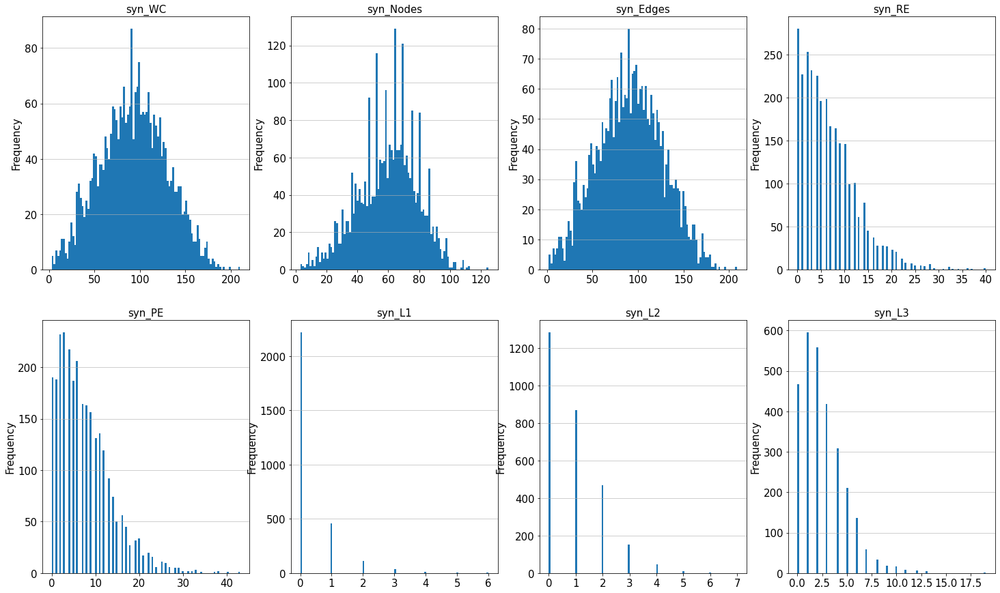

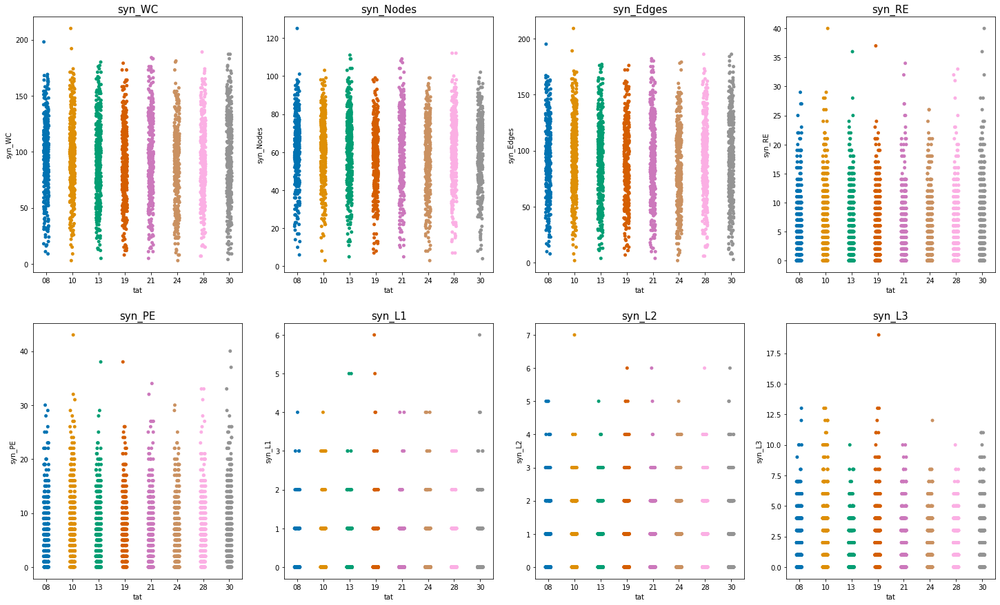

In [16]:

# ----------- Histogram: WC, Nodes, Edges, RE, PE, L1, L2, L3 -----------
plot_variables = ['syn_WC', 'syn_Nodes', 'syn_Edges',
                  'syn_RE', 'syn_PE', 'syn_L1', 'syn_L2', 'syn_L3']
# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    plt.hist(df[variable], bins=100)
    plt.grid(axis='y', alpha=0.75)
    plt.ylabel('Frequency', fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Test' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


# ----------- Stripplot: -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    sns.stripplot(y=variable, x='tat',
                  data=df,
                  palette="colorblind",
                  )
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Syntactic_graph_analysis_basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


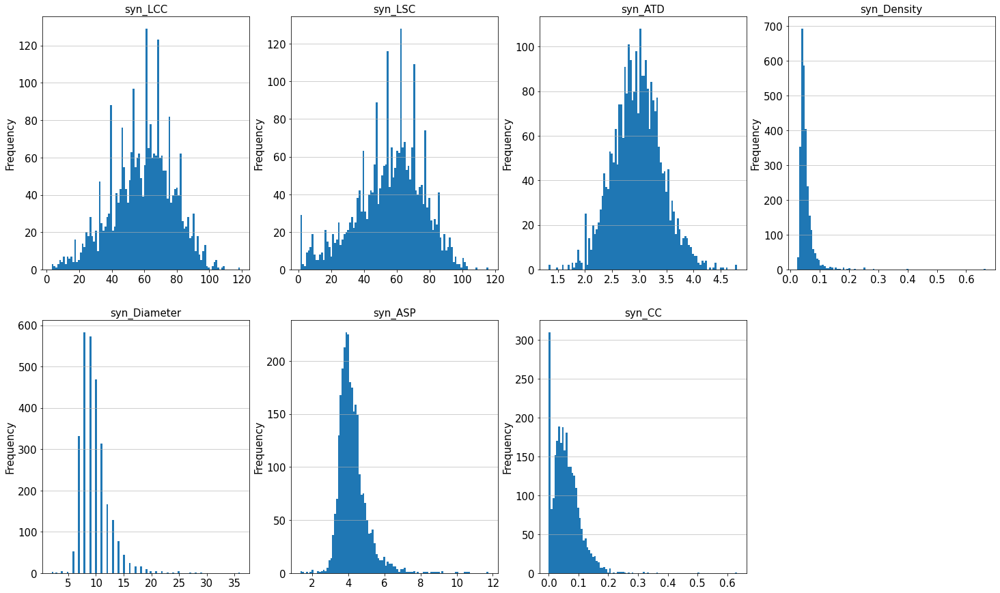

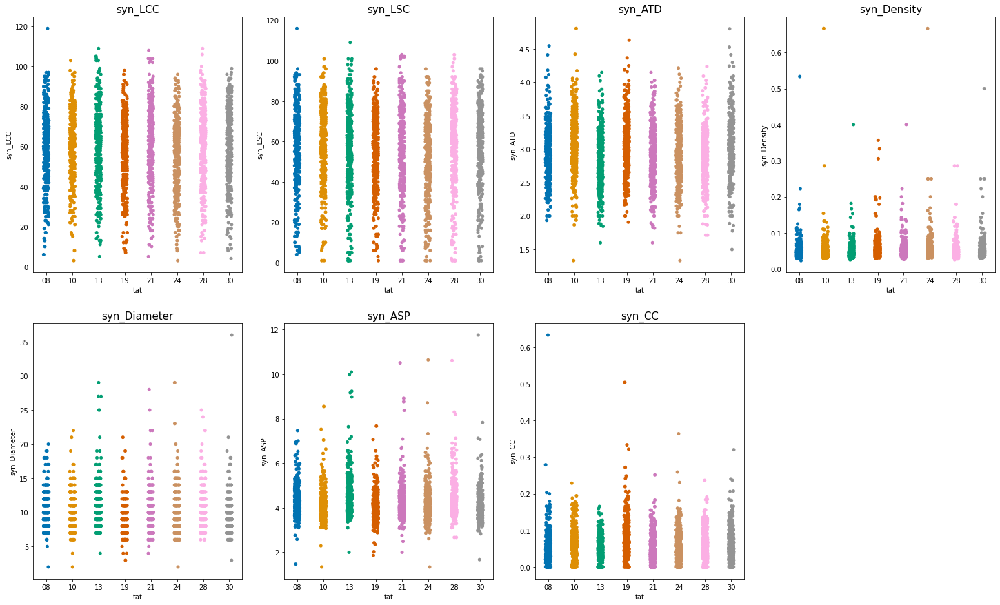

In [17]:

# ----------- Histogram: LCC, LSC, ATD, Density, Diameter, ASP, CC -----------
plot_variables = ['syn_LCC', 'syn_LSC', 'syn_ATD','syn_Density','syn_Diameter', 'syn_ASP', 'syn_CC']
# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    plt.hist(df[variable], bins=100)
    plt.grid(axis='y', alpha=0.75)
    plt.ylabel('Frequency', fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Test' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


# ----------- Stripplot -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    sns.stripplot(y=variable, x='tat',
                  data=df,
                  palette="colorblind",
                  )
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Syntactic_graph_analysis_components' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


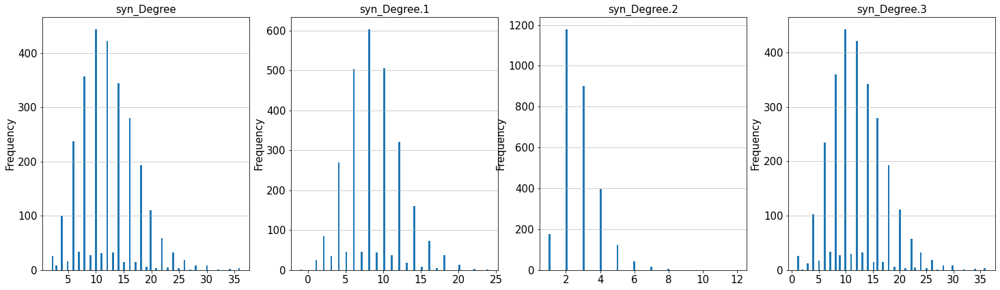

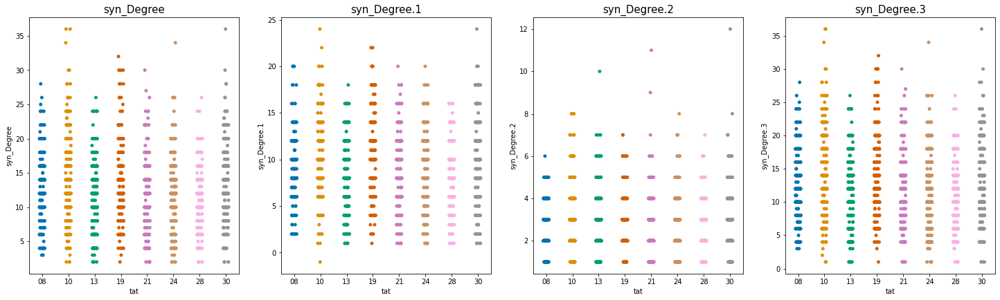

In [18]:

# ----------- Histogram: Hub, Degree, 2nd Hub, Degree.1, Pair, Degree.2, LSCHub -----------
plot_variables = [ 'syn_Degree',  'syn_Degree.1','syn_Degree.2',  'syn_Degree.3']

# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    plt.hist(df[variable], bins=100)
    plt.grid(axis='y', alpha=0.75)
    plt.ylabel('Frequency', fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Test' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


# ----------- Stripplot -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))

# Plot subplots
for v, variable in enumerate(plot_variables):
    ax = plt.subplot(2, 4, v + 1)
    sns.stripplot(y=variable, x='tat',
                  data=df,
                  palette="colorblind",
                  )
    plt.title('{}'.format(variable), fontsize=15)

# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Syntactic_graph_analysis_Degrees' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)


In [19]:
# # word_variables = ['syn_Hub','syn_2nd Hub','syn_Pair','syn_LSCHub']
# word_variables = ['syn_2nd Hub','syn_Pair','syn_LSCHub']
# # --------------------- Word clouds ---------------------------------------
# fig = plt.figure(figsize=(25, 25))

# n_subplots = len(word_variables)
# n_cols_subplots = np.ceil(np.sqrt(n_subplots))
# n_rows_subplots = np.ceil(n_subplots / n_cols_subplots)
# for v, variable in enumerate(word_variables):
#     var_words_joined = (' ').join(list(df[variable].values))
#     ax = plt.subplot(n_rows_subplots, n_cols_subplots, t + 1)
#     wordcloud = WordCloud(background_color=None,
#                           mode="RGBA").generate(tat_words_joined)
#     plt.imshow(wordcloud, interpolation='bilinear')
#     plt.title('TAT' + tat, fontsize=15)
#     plt.axis("off")

# output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
# # output = op.join(output_dir, 'Syntactic_graph_analysis_WordClouds_' +
# #                  '_{0}'.format(str(datetime.date.today())))
# # plt.savefig(output)
# plt.show()